>> Anotacoes: imagens sao feitas por 3 camadas RGB (255 o max) e a escala de cinza faz essas 3 camadas possuirem os mesmos valores para cada pixel.

>> Para um algoritmo de deteccao de face vc precisa de dois dataset, uma de faces e um de "nao faces"

>> as imanges sao enviadas para um algoritmo chamado adaboost training onde fara o treinamento. Ele recebe e entende os padroes das faces. Ele utiliza feature selection como diz a imagem. Ele conta os pixels brancos e pretos nas imagens e dps testa outra forma e assim por diante. Chamado de classificador Cascade e ao fim eh criado uma matriz.

>> A imagem eh passadapor um conjun to de classificadores, como um classificador de olhos, nariz, bocas e afins. Uma face eh um conjunto de elementos, logo os classificadores precisam dar positivo para ser considerado uma face.



In [1]:
# bibliotecas utilizadas
import cv2 #OpenCV
from google.colab.patches import cv2_imshow
from google.colab import drive

#Projeto 1 - Deteccao de faces

## Teste 1

In [2]:
# drive
drive.mount('/content/drive')

Mounted at /content/drive


In [25]:
# carrega a imagem
imagem = cv2.imread('/content/drive/MyDrive/Visão Computacional Guia Completo/Images/people1.jpg')

In [4]:
imagem.shape

(1280, 1920, 3)

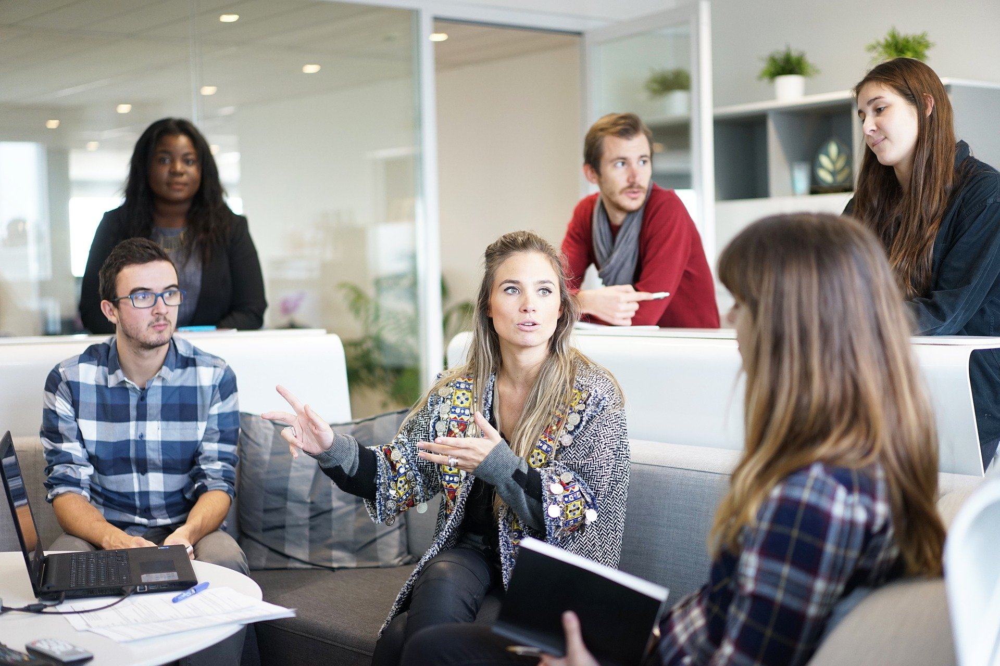

In [5]:
cv2_imshow(imagem)

In [26]:
# diminuir tamanho da imagem
img = cv2.resize(imagem, (960, 640))
img.shape

(640, 960, 3)

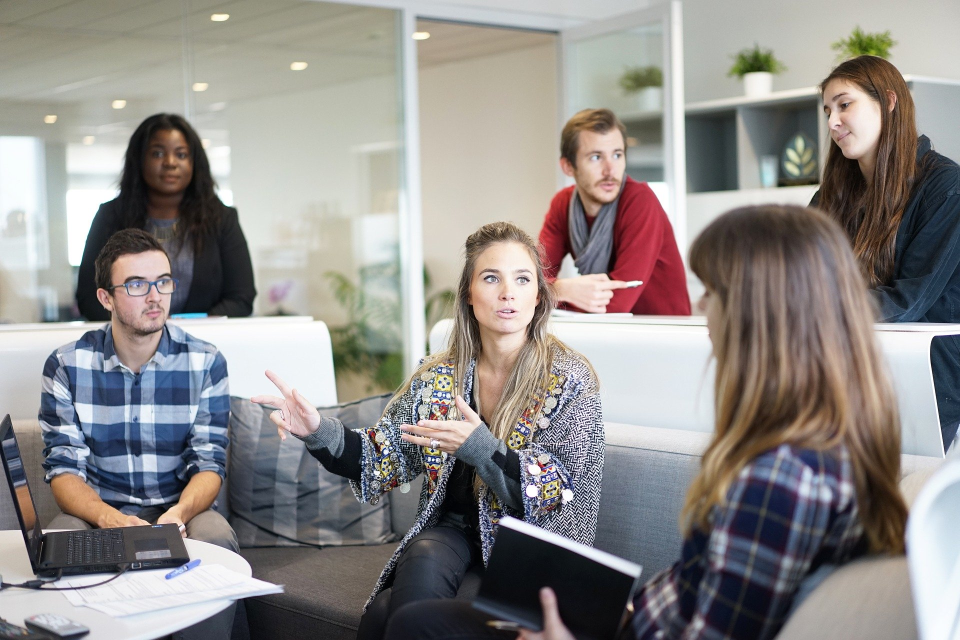

In [27]:
cv2_imshow(img)

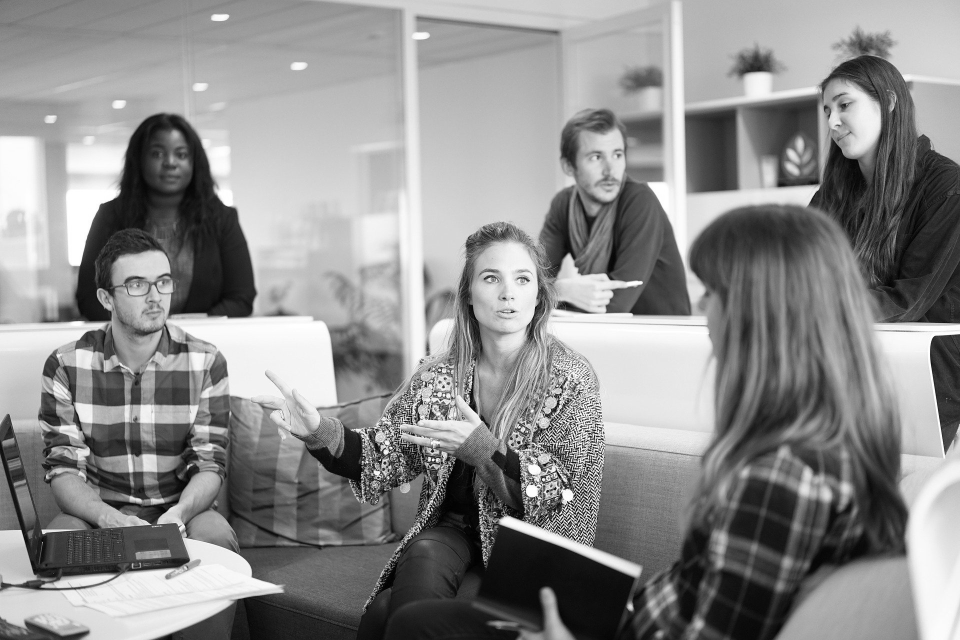

In [28]:
# escala de cinza
img_cinza = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) #BGR = RGB
cv2_imshow(img_cinza)

In [29]:
img_cinza.shape #nao tem 3 canais mais

(640, 960)

>> Antes a imagem continha 1280px por 1920px em 3 canais o que representava um total de 7.372.800 informacoes. Com a reducao do tamanho e o filtro de cinza ela agor acontem apenas 614.400 informacoes a serem processadas.

In [10]:
# o opencv ja possui um arquivo xml que ja possui um modelo treinado para esse quesito.
dect_facial = cv2.CascadeClassifier('/content/drive/MyDrive/Visão Computacional Guia Completo/Cascades/haarcascade_frontalface_default.xml')

In [11]:
deteccoes = dect_facial.detectMultiScale(img_cinza) #deteccao na imagem cinza utilizando esse detector

In [12]:
deteccoes
# os 2 primeiros valores de cada lista representam onde a coordenada cartesiana (X,Y) onde a face comeca.
# os 2 ultimos valores de cada lista representam o tamanho da face encontrada

array([[141, 131,  58,  58],
       [817,  77,  74,  74],
       [573, 130,  66,  66],
       [114, 253,  73,  73],
       [465, 246,  85,  85]], dtype=int32)

In [13]:
len(deteccoes) #quantidade de faces encontradas

5

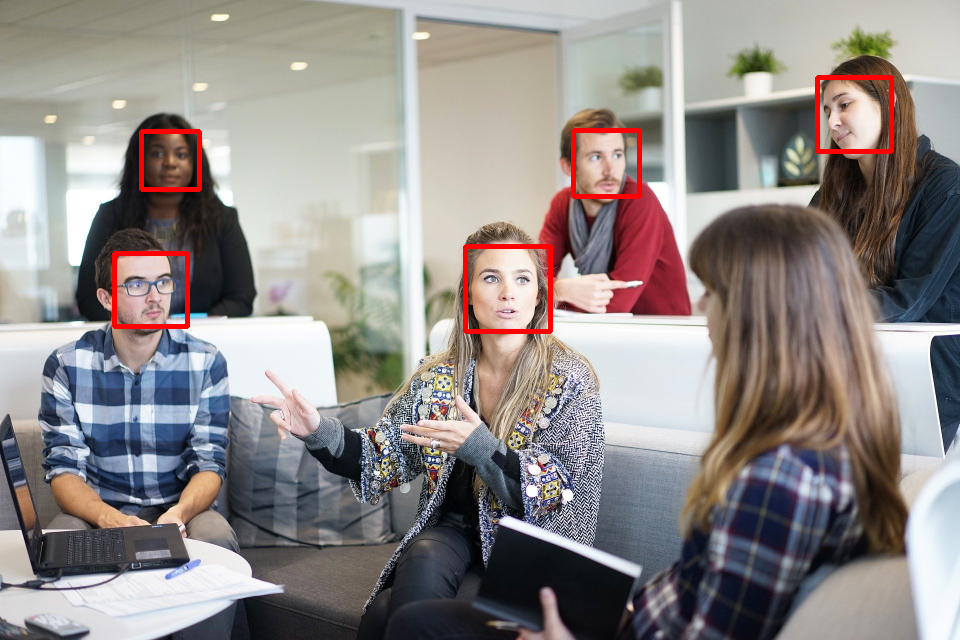

In [14]:
#desenhando retangulos
for x,y,w,h in deteccoes:
  cv2.rectangle(img, (x,y),(x+w,y+h),(0,0,255),3)
cv2_imshow(img)

## Teste 2 hiperparametros

>scaleFactor aumenta a escala da imagem, ideal para quando temos imagens muito pequenas ou entao muito grandes

>minNeighbors indica o numero de retnagulos candidatos para escolher o melhor retangulo final, ou seja, ele encontra N vezes a mesma face e escolhe qual melhor retangulo a encontrou no final.

>minSize indica qual o tamanho minimo das faces para o algorito fazer a deteccao.

>maxSize indica qual o tamanho maximo das faces para o algorito fazer a deteccao.

In [30]:
# brincando com paramentros do haarcascades
deteccoes = dect_facial.detectMultiScale(img_cinza, scaleFactor=1.1)

#scaleFactor aumenta a escala da imagem, ideal para quando temos imagens muito pequenas ou entao muito grandes

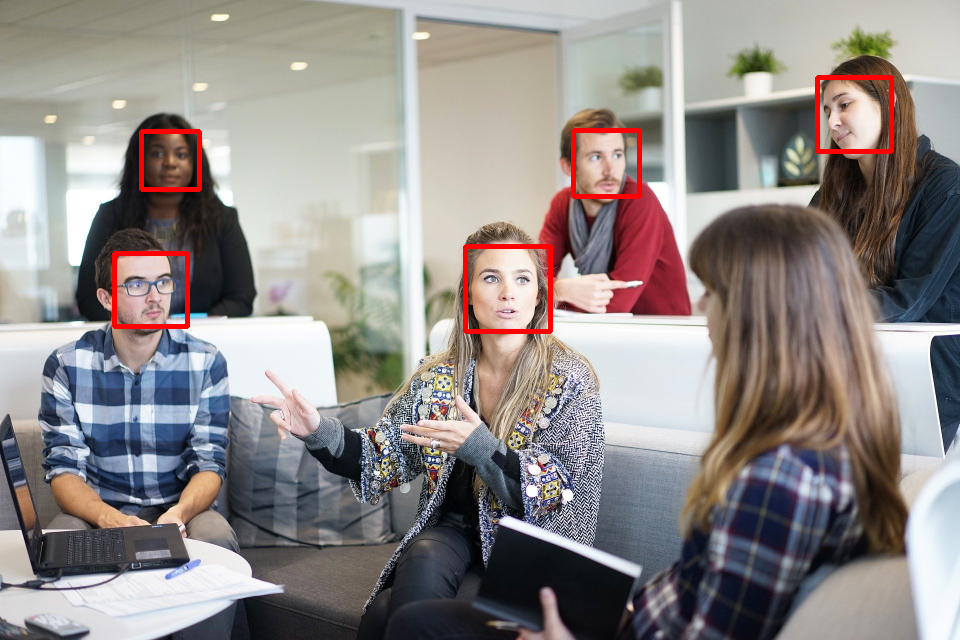

In [31]:
#desenhando retangulos
for x,y,w,h in deteccoes:
  cv2.rectangle(img, (x,y),(x+w,y+h),(0,0,255),3)
cv2_imshow(img)

In [54]:
# carrega a imagem 2 para teste 2
imagem = cv2.imread('/content/drive/MyDrive/Visão Computacional Guia Completo/Images/people2.jpg')
imagem.shape

(537, 1023, 3)

47 47
47 47
49 49
49 49
44 44
51 51
52 52
50 50
51 51
47 47
51 51
47 47


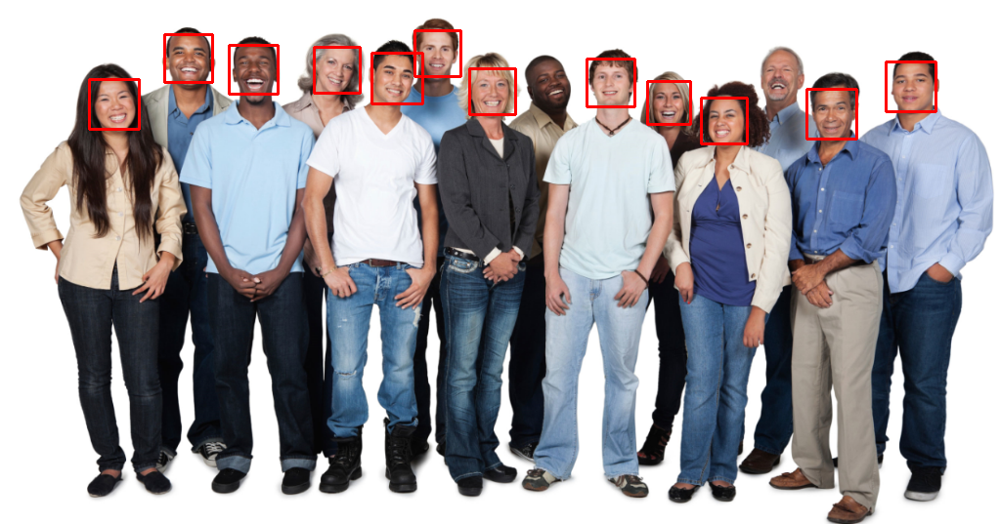

In [55]:
# teste 2
img_cinza = cv2.cvtColor(imagem, cv2.COLOR_BGR2GRAY) #BGR = RGB
deteccoes = dect_facial.detectMultiScale(img_cinza, scaleFactor=1.2, minNeighbors=5, minSize=(30,30), maxSize=(100, 100))

#minNeighbors indica o numero de retnagulos candidatos para escolher o melhor retangulo final, ou seja,
#ele encontra N vezes a mesma face e escolhe qual melhor retangulo a encontrou no final. Quanto maior o valor maior eh a certeza
#do algoritmo em dizer que eh uma face.

#minSize indica qual o tamanho minimo das faces para o algorito fazer a deteccao.
#maxSize indica qual o tamanho maximo das faces para o algorito fazer a deteccao.

for x,y,w,h in deteccoes:
  print(w,h)
  cv2.rectangle(imagem, (x,y),(x+w,y+h),(0,0,255),2)
cv2_imshow(imagem)

# Projeto 2 - Deteccao de olhos

In [58]:
#detector de olhos
detector_olhos = cv2.CascadeClassifier('/content/drive/MyDrive/Visão Computacional Guia Completo/Cascades/haarcascade_eye.xml')

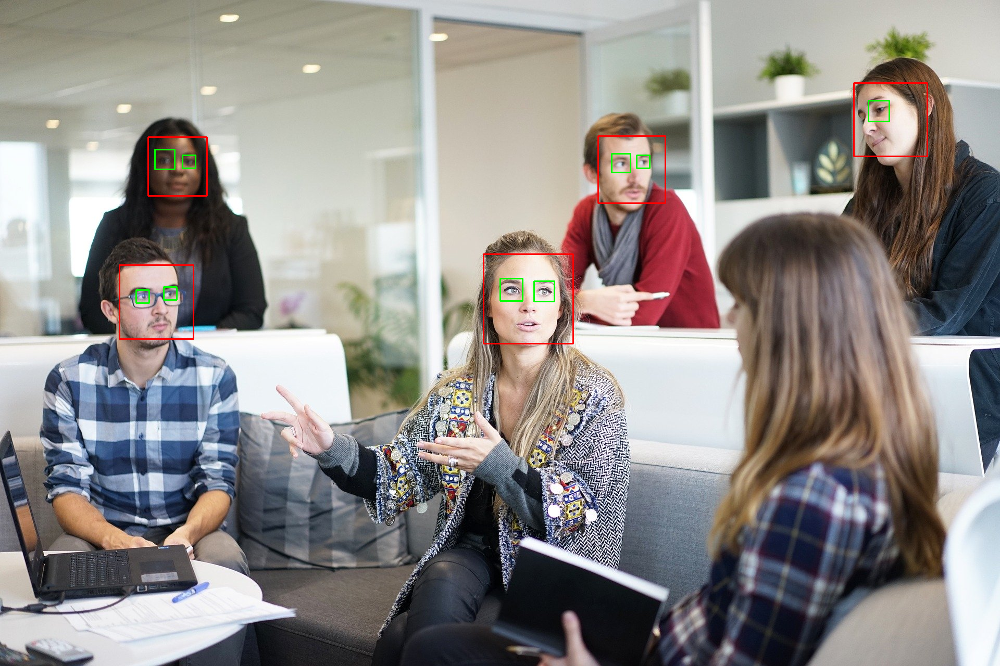

In [70]:
img = cv2.imread('/content/drive/MyDrive/Visão Computacional Guia Completo/Images/people1.jpg')
#img = cv2.resize(imagem, (960, 640))
img_cinza = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) #BGR = RGB

deteccoes = dect_facial.detectMultiScale(img_cinza, scaleFactor=1.1, minSize=(70,70))
for x,y,w,h in deteccoes:
  cv2.rectangle(img, (x,y),(x+w,y+h),(0,0,255),2)


deteccoes_olhos = detector_olhos.detectMultiScale(img_cinza, scaleFactor=1.09, minNeighbors=10, maxSize=(70,70))
for x,y,w,h in deteccoes_olhos:
  cv2.rectangle(img, (x,y), (x+w,y+h),(0,255,0),2)
cv2_imshow(img)

# Porjeto 3 - Deteccao de objetos variados

## Carros

In [71]:
#detector de carros
detector_carros = cv2.CascadeClassifier('/content/drive/MyDrive/Visão Computacional Guia Completo/Cascades/cars.xml')

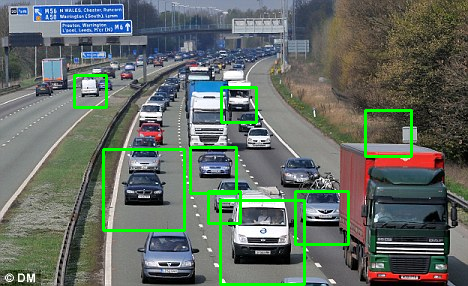

In [74]:
img = cv2.imread('/content/drive/MyDrive/Visão Computacional Guia Completo/Images/car.jpg')
#img = cv2.resize(imagem, (960, 640))
img_cinza = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) #BGR = RGB

deteccoes_carros = detector_carros.detectMultiScale(img_cinza, scaleFactor=1.03, minNeighbors=5)
for x,y,w,h in deteccoes_carros:
  cv2.rectangle(img, (x,y), (x+w,y+h),(0,255,0),2)
cv2_imshow(img)

## Relogios

In [76]:
#detector de relogios
detector_relogios = cv2.CascadeClassifier('/content/drive/MyDrive/Visão Computacional Guia Completo/Cascades/clocks.xml')

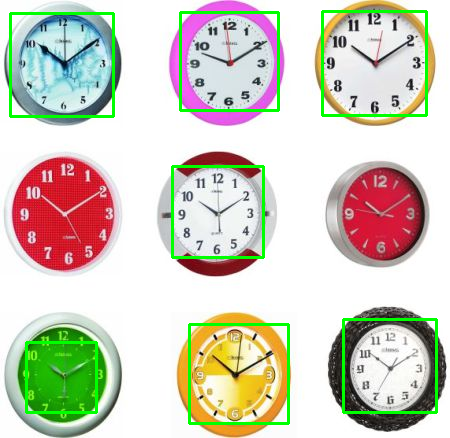

In [77]:
img = cv2.imread('/content/drive/MyDrive/Visão Computacional Guia Completo/Images/clock.jpg')
#img = cv2.resize(imagem, (960, 640))
img_cinza = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) #BGR = RGB

deteccoes_relogios = detector_relogios.detectMultiScale(img_cinza, scaleFactor=1.03, minNeighbors=1)
for x,y,w,h in deteccoes_relogios:
  cv2.rectangle(img, (x,y), (x+w,y+h),(0,255,0),2)
cv2_imshow(img)

## Corpo Inteiro

In [79]:
#detector de corpos inteiros
detector_corpos = cv2.CascadeClassifier('/content/drive/MyDrive/Visão Computacional Guia Completo/Cascades/fullbody.xml')

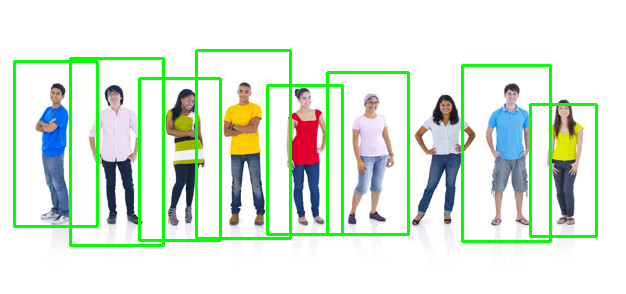

In [80]:
img = cv2.imread('/content/drive/MyDrive/Visão Computacional Guia Completo/Images/people3.jpg')
#img = cv2.resize(imagem, (960, 640))
img_cinza = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) #BGR = RGB


deteccoes_corpos = detector_corpos.detectMultiScale(img_cinza, scaleFactor=1.05, minNeighbors=5, minSize=(50,50))
for x,y,w,h in deteccoes_corpos:
  cv2.rectangle(img, (x,y), (x+w,y+h),(0,255,0),2)
cv2_imshow(img)

# Projeto 3 - Deteccao com HOG e Dlib

HOG = Histograms of Oriented Gradients

Infos importantes:
* Derivadas aqui medem o grau da mudanca de cores, pode ser alta, baixa ou zero. Facilita encontrar bordas.
* Gradiente Vector mostra a direcao que os valores das cores mudam. Utiliza pixels vizinhos para o calculo da direcao desse vetor. Utiliza duas matrizes (direcao e magnitude)

Ao fim, eh feito uma comparacao entre o histograma encontrado a partir dessas matrizes com o histograma original da imagem, se baterem tem um deteccao bem sucedida.

## Deteccao de faces com HOG e Dlib